In [9]:
import pandas as pd
import numpy as np
import datetime
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import matplotlib.pyplot as plt

df = pd.read_csv('D:\\Hemant\\Msc\\Sem 3\\project\\car data\\autos_cleaned.csv',engine="python")
df= df.set_index('srno')
df.head(10)

,Brand,Model,Year_Of_Registration,Month_Of_Registation,Km_Driven,Price_inEURO,ABTest,GearBox,PowerPS,FuelType,VehicleType,Repaired_Damage
srno,,,,,,,,,,,,
1,audi,NaN,2011,5,125000,18300,test,manual,190,diesel,coupe,yes
2,jeep,grand,2004,8,125000,9800,test,automatic,163,diesel,suv,NaN
3,volkswagen,golf,2001,6,150000,1500,test,manual,75,petrol,hatchback,no
4,skoda,fabia,2008,7,90000,3600,test,manual,69,diesel,hatchback,no
5,peugeot,2_reihe,2004,8,150000,2200,test,manual,109,petrol,convertible,no
6,ford,c_max,2014,8,30000,14500,control,manual,125,petrol,wagon,NaN
7,mazda,3_reihe,2004,12,150000,2000,control,manual,105,petrol,sedan,no
8,volkswagen,passat,2005,12,150000,2799,control,manual,140,diesel,sedan,yes
9,volkswagen,passat,2004,2,150000,2500,control,manual,131,NaN,sedan,no


In [2]:
df['Brand'].unique()

array(['audi', 'jeep', 'volkswagen', 'skoda', 'peugeot', 'ford', 'mazda',
       'nissan', 'renault', 'mercedes_benz', 'bmw', 'opel', 'citroen',
       'honda', 'fiat', 'mini', 'smart', 'hyundai', 'seat', 'volvo',
       'mitsubishi', 'alfa_romeo', 'kia', 'lancia', 'porsche',
       'sonstige_autos', 'chevrolet', 'dacia', 'daihatsu', 'toyota',
       'suzuki', 'chrysler', 'rover', 'daewoo', 'saab', 'subaru',
       'land_rover', 'yesguar', 'lada', 'trabant', 'jaguar'], dtype=object)

In [3]:
bd = 'audi'
yor = 2011
df_brand_year = df.query('Brand == "'+bd+'" and Year_Of_Registration == '+str(yor))
df_brand_year.head(2)
avg = np.average(df_brand_year['Price_inEURO'])



In [4]:
#Distribution of price over year
#Scatter plot
fig = px.scatter(df_brand_year,x='Month_Of_Registation',y='Price_inEURO')
#fig.show()

#df_brand['Price_inEURO'].max()

In [5]:
fig = go.Figure(data=go.Scatter(
    x=df_brand['Year_Of_Registration'],
    y=df_brand['Price_inEURO'],
    mode='markers',
    marker=dict(
        size=8,
        color= df_brand['Price_inEURO'], 
        colorscale='Viridis',
        showscale=True
    )
))

fig.show()

NameError: name 'df_brand' is not defined

In [ ]:
years = df['Year_Of_Registration'].unique()
df_brand = df.loc[df['Brand']=='audi']
years
av_price = []
for year in years:
    df_year = df_brand.query('Year_Of_Registration == '+str(year))
    avg_price = np.average(df_year['Price_inEURO'])
    av_price.append(avg_price)
av_price

data = {'Years':years,
       'Average Price':av_price}
avg_df = pd.DataFrame(data)
avg_df.sort_values(by='Years')
    

In [61]:
df_brand = df.loc[df['Brand']=='ford']
#df.loc[df['Model']=='NA']
df_brand.loc[df_brand['Year_Of_Registration']==2002]
#df_brand.query('Year_Of_Registration ==2002, Month_Of_Registation == 5, Km_Driven == 125000 and PowerPS==190')

,Brand,Model,Year_Of_Registration,Month_Of_Registation,Km_Driven,Price_inEURO,ABTest,GearBox,PowerPS,FuelType,VehicleType,Repaired_Damage
srno,,,,,,,,,,,,
47,ford,fiesta,2002,4,150000,750,control,manual,50,petrol,hatchback,no
78,ford,focus,2002,1,125000,1750,test,manual,75,petrol,sedan,no
127,ford,ka,2002,8,150000,1350,test,manual,60,petrol,hatchback,NaN
144,ford,mondeo,2002,12,150000,800,control,manual,115,diesel,sedan,NaN
576,ford,focus,2002,4,150000,1320,control,manual,116,diesel,sedan,no
...,...,...,...,...,...,...,...,...,...,...,...,...
236010,ford,fiesta,2002,6,150000,1550,test,manual,68,diesel,hatchback,no
236059,ford,focus,2002,12,150000,699,test,manual,0,petrol,sedan,NaN
236355,ford,focus,2002,4,150000,1500,control,manual,116,diesel,sedan,yes


In [ ]:
df[''].unique()

In [29]:
#K-nn Classifier

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()



np.set_printoptions(precision=2)

df_car = pd.read_csv('D:\\Hemant\\Msc\\Sem 3\\project\\car data\\autos_cleaned.csv',engine="python")


df_brand = df_car.loc[df_car['Brand']=='audi']

car_features = ['Year_Of_Registration','Km_Driven']

X_Car = df_brand[car_features]
Y_Car = df_brand['PowerPS']
target_car = df_brand.Price_inEURO.values

X_train, X_test, y_train, y_test = train_test_split(X_Car, Y_Car, random_state=0)

scaler = MinMaxScaler()

X_train_scale = scaler.fit_transform(X_train)
X_test_scale = scaler.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=10000)
#knn = KNeighborsClassifier(n_neighbors = 5)

knn.fit(X_train_scale, y_train)

print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(X_train_scale, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}' 
     .format(knn.score(X_test_scale, y_test)))

example_car = [[2011, 20000]]
example_car_scaled = scaler.transform(example_car)
print('Predicted Car price for ', example_car, ' is ', target_car[knn.predict(example_car_scaled)[0]-1])

Accuracy of K-NN classifier on training set: 0.10
Accuracy of K-NN classifier on test set: 0.09
Predicted Car price for  [[2011, 20000]]  is  8500


In [22]:
df_brand.loc[df_brand['Km_Driven']==5000]

,srno,Brand,Model,Year_Of_Registration,Month_Of_Registation,Km_Driven,Price_inEURO,ABTest,GearBox,PowerPS,FuelType,VehicleType,Repaired_Damage
172,173,audi,a6,2015,7,5000,56900,control,automatic,326,diesel,sedan,no
5147,5148,audi,a4,2004,8,5000,3200,control,manual,163,diesel,sedan,NaN
5588,5589,audi,a4,2007,11,5000,11990,control,automatic,239,diesel,sedan,no
6503,6504,audi,a4,2009,12,5000,9000,test,manual,2,diesel,sedan,NaN
8451,8452,audi,NaN,2015,12,5000,52000,test,automatic,326,diesel,suv,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...
231628,231629,audi,a1,2014,11,5000,15650,test,manual,86,petrol,hatchback,no
233160,233161,audi,a4,2003,1,5000,5499,control,automatic,163,petrol,sedan,no
233791,233792,audi,a3,2000,3,5000,999,test,manual,165,diesel,NaN,NaN
234807,234808,audi,a4,2017,11,5000,1150,control,manual,0,petrol,NaN,yes


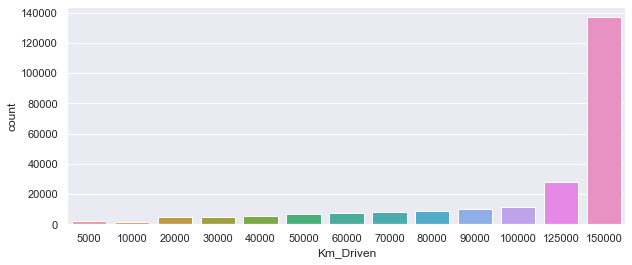

In [31]:
f = plt.figure(figsize=(10,4))
sns.countplot(x=df['Km_Driven'], data=df)
plt.show()

In [32]:
df.query('Km_Driven >=5000 and Km_Driven <= 30000')

,Brand,Model,Year_Of_Registration,Month_Of_Registation,Km_Driven,Price_inEURO,ABTest,GearBox,PowerPS,FuelType,VehicleType,Repaired_Damage
srno,,,,,,,,,,,,
6,ford,c_max,2014,8,30000,14500,control,manual,125,petrol,wagon,NaN
22,bmw,3er,2007,5,20000,18000,test,automatic,218,petrol,sedan,no
35,hyundai,NaN,2016,1,5000,1400,control,manual,55,NaN,NaN,NaN
37,bmw,NaN,2014,7,30000,39600,test,automatic,306,petrol,coupe,no
96,volkswagen,NaN,2009,5,20000,6799,control,NaN,60,petrol,hatchback,no
...,...,...,...,...,...,...,...,...,...,...,...,...
237048,mini,cooper,2015,4,20000,23490,test,manual,122,petrol,convertible,no
237070,mazda,cx_reihe,2015,9,10000,32900,test,automatic,175,diesel,suv,no
237109,hyundai,i_reihe,2013,9,30000,16500,control,manual,116,diesel,suv,no


In [34]:
def scatterPlot():
    fig = go.Figure(data=go.Scatter(
    x= df['Km_Driven'],
    y= df['Price_inEURO'],
    mode='markers',
    #height=700,
    marker=dict(
        size=8,
        color= df['Price_inEURO'], 
        colorscale='Viridis',
        showscale=True
    )))
    return fig.show()
scatterPlot()